# Unsupervised Learning and Analysis of SETI Spectrograms for CSCA 5632

## Project Overview
    This project implements unsupervised learning techniques to analyze radio signal spectrograms from the Breakthrough Listen project (https://www.kaggle.com/datasets/tentotheminus9/seti-data). The primary goal is anomaly detection, with signal classification (exploratory) as a secondary objective, using unsupervised machine learning approaches.

### Data Inspection

Below we'll examine the data and get an idea of the amount and different types of signals in the dataset.

In [1]:
%load_ext autoreload
%autoreload 2

In [28]:
# But first, imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
import os

# Helper functions
import sys
sys.path.append('..')
from src.preprocess import preprocess_all_data, visualize_preprocessing_steps, preprocess_image
from src.dimensionality_reduction import reduce_dimensions, plot_reduced_dimensions
from src.cluster_analysis import analyze_clusters, analyze_feature_importance
from src.anomaly_detection import prepare_anomaly_data, detect_anomalies
from src.matrix_factorization import analyze_matrix_factorization
from src.anomaly_detection import enhanced_anomaly_detection

from tqdm.notebook import tqdm
from sklearn.decomposition import PCA

# Set style for visualizations
plt.style.use('seaborn-v0_8-dark-palette')
sns.set_palette('husl')

In [3]:
# Setup paths
raw_dir = Path('../data/raw')
processed_dir = Path('../data/processed')
profiles_dir = Path('../data/profiles')

# List all signal types
signal_types = [d.name for d in raw_dir.iterdir() if d.is_dir()]
print(f"Signal types: {signal_types}")

# Count images per class
for signal_type in signal_types:
    n_images = len(list((raw_dir / signal_type).glob('*.png')))
    print(f"{signal_type}: {n_images} images")

Signal types: ['narrowband', 'squiggle', 'squigglesquarepulsednarrowband', 'squarepulsednarrowband', 'narrowbanddrd', 'noise', 'brightpixel']
narrowband: 999 images
squiggle: 999 images
squigglesquarepulsednarrowband: 999 images
squarepulsednarrowband: 999 images
narrowbanddrd: 999 images
noise: 999 images
brightpixel: 999 images


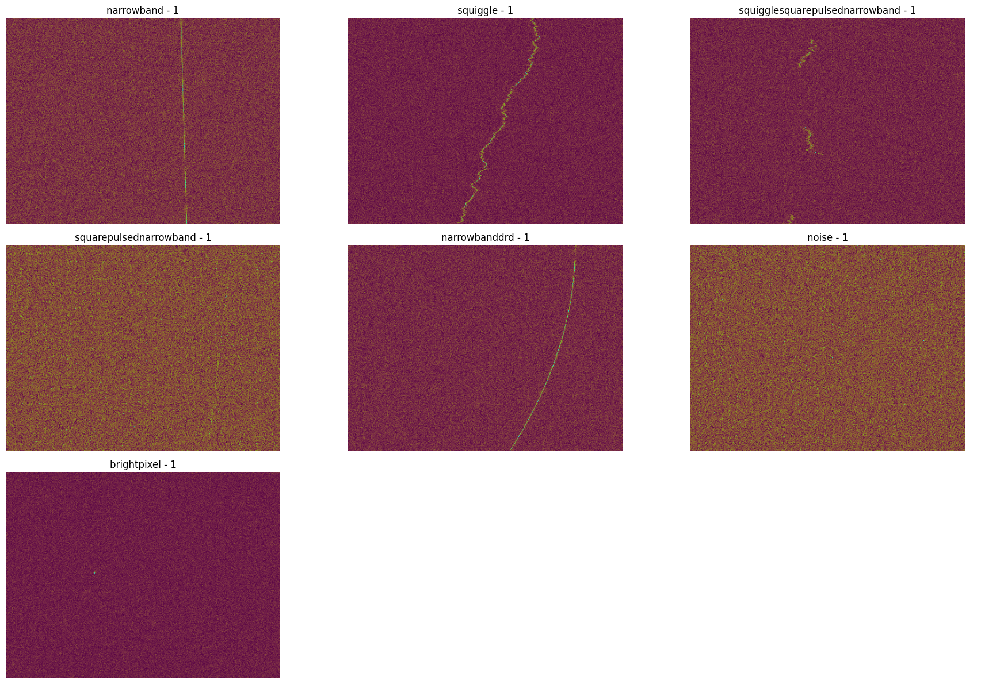

In [4]:
# Set random seed for reproducibility
np.random.seed(42)

# Get sample images for each signal type
sample_paths = {}
n_samples = 1

for signal_type in signal_types:
    all_paths = list((raw_dir / signal_type).glob('*.png'))
    if n_samples >= len(all_paths):
        selected_paths = all_paths
    else:
        selected_indices = np.random.choice(len(all_paths), n_samples, replace=False)
        selected_paths = [all_paths[i] for i in selected_indices]
    
    sample_paths[signal_type] = selected_paths

# Plot the sample images
n_cols = 3
n_rows = (len(signal_types) * n_samples + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4*n_rows))
axes = axes.flatten()

idx = 0
for signal_type in signal_types:
    for i, img_path in enumerate(sample_paths[signal_type]):
        if idx < len(axes):
            img = cv2.imread(str(img_path))
            axes[idx].imshow(img, cmap='gray')
            axes[idx].set_title(f'{signal_type} - {i+1}')
            axes[idx].axis('off')
            idx += 1

# Hide any unused subplots
for i in range(idx, len(axes)):
    axes[i].axis('off')
    
plt.tight_layout()
plt.show()

### Preprocessing Pipeline
Below we'll implement a preprocessing pipeline that includes:
1. Grayscale conversion
2. Statistical filtering
3. Gaussian blur
4. Morphological operations
5. Edge detection
6. Size normalization
7. Intensity profile extraction

Below we'll illustrate the preprocessing pipeline with sample images.

In [5]:
# Using absolute paths for sample images

# Get the absolute path to the project root
PROJECT_ROOT = Path(os.getcwd()).parent if 'notebooks' in os.getcwd() else Path(os.getcwd())

# Update the paths to use absolute paths
sample_image_paths = {
    'narrowband': str(PROJECT_ROOT / 'data/raw/narrowband/183_narrowband.png'),
    'squiggle': str(PROJECT_ROOT / 'data/raw/squiggle/3850_squiggle.png'),
    'squigglesquarepulsednarrowband': str(PROJECT_ROOT / 'data/raw/squigglesquarepulsednarrowband/5380_squigglesquarepulsednarrowband.png'),
    'squarepulsednarrowband': str(PROJECT_ROOT / 'data/raw/squarepulsednarrowband/4455_squarepulsednarrowband.png'),
    'narrowbanddrd': str(PROJECT_ROOT / 'data/raw/narrowbanddrd/4840_narrowbanddrd.png'),
    'noise': str(PROJECT_ROOT / 'data/raw/noise/4698_noise.png'),
    'brightpixel': str(PROJECT_ROOT / 'data/raw/brightpixel/1360_brightpixel.png')
}



Preprocessing steps for narrowband:


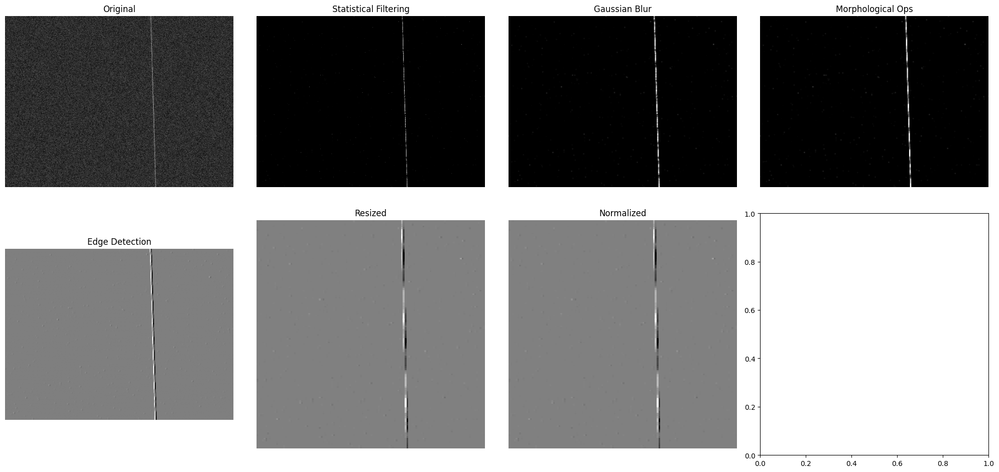


Preprocessing steps for squiggle:


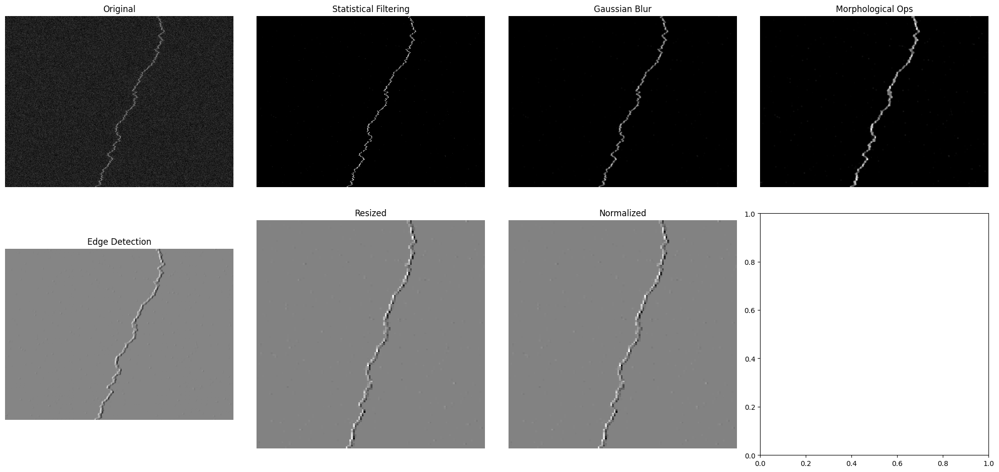


Preprocessing steps for squigglesquarepulsednarrowband:


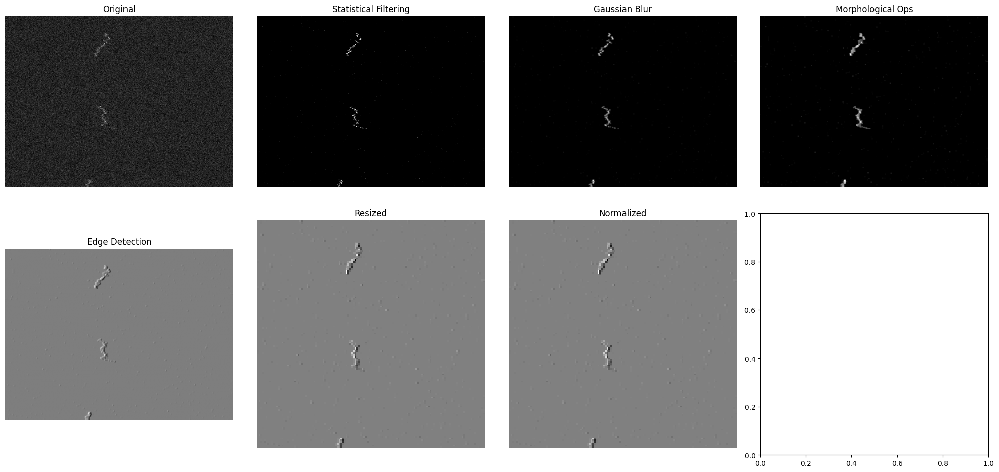


Preprocessing steps for squarepulsednarrowband:


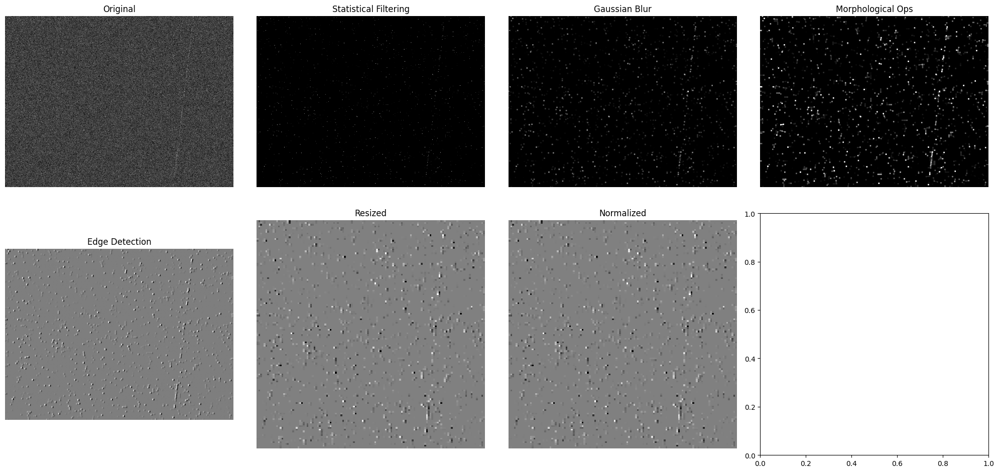


Preprocessing steps for narrowbanddrd:


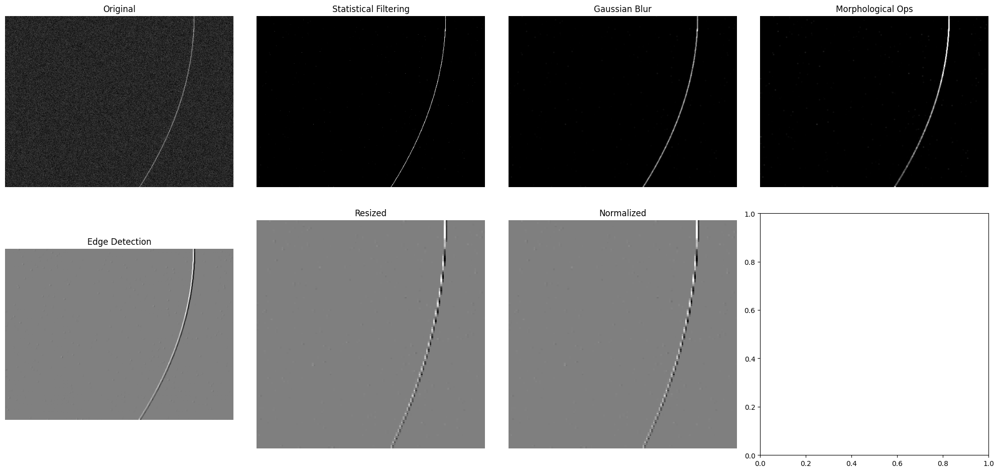


Preprocessing steps for noise:


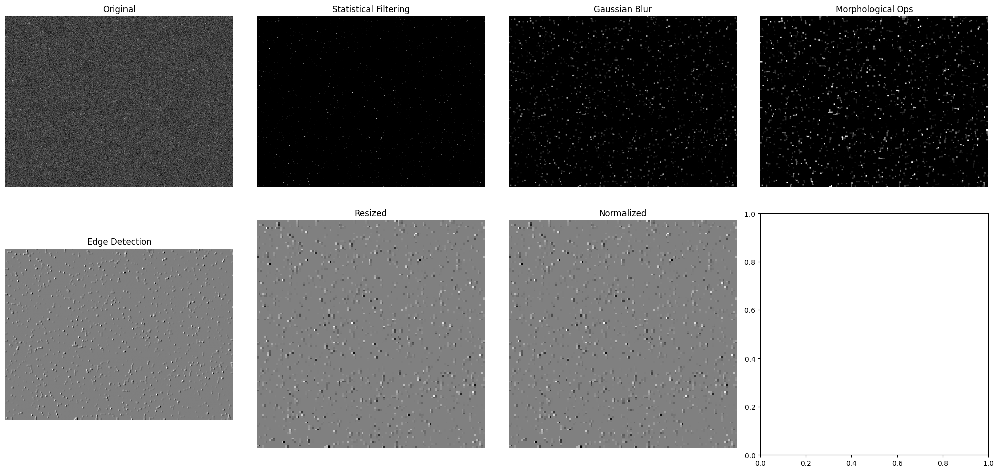


Preprocessing steps for brightpixel:


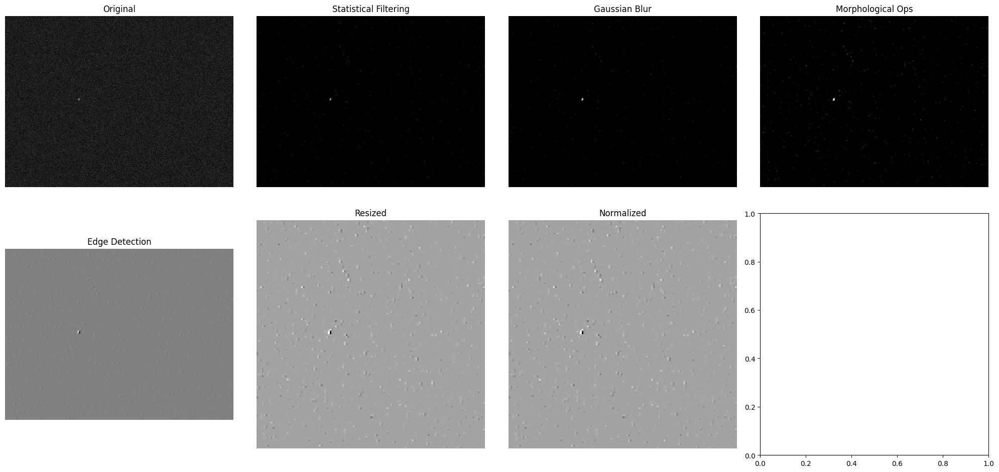

In [7]:
preprocessed_images = {}
for signal_type in signal_types:
    print(f"\nPreprocessing steps for {signal_type}:")
    img_path = sample_image_paths[signal_type]
    fig = visualize_preprocessing_steps(img_path)
    plt.figure(fig.number)
    plt.show()


Calculating intensity profiles for narrowband:


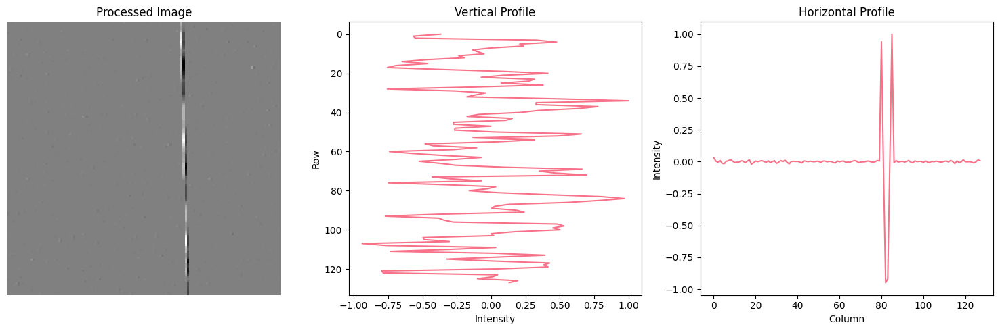


Calculating intensity profiles for squiggle:


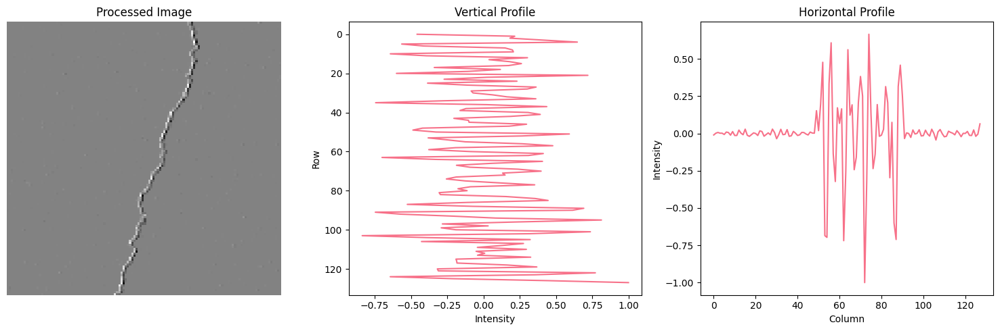


Calculating intensity profiles for squigglesquarepulsednarrowband:


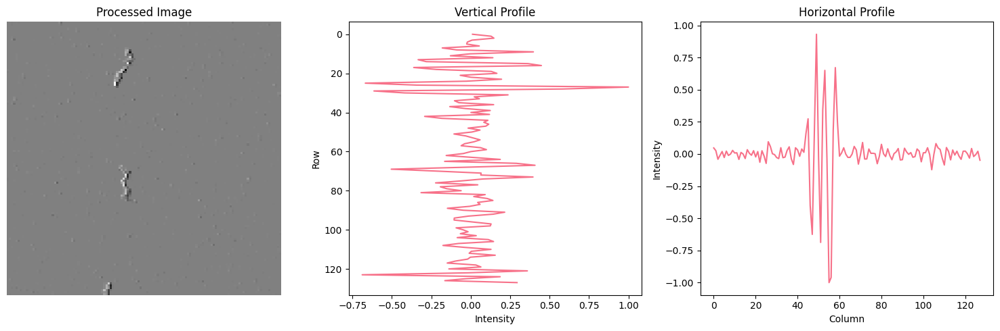


Calculating intensity profiles for squarepulsednarrowband:


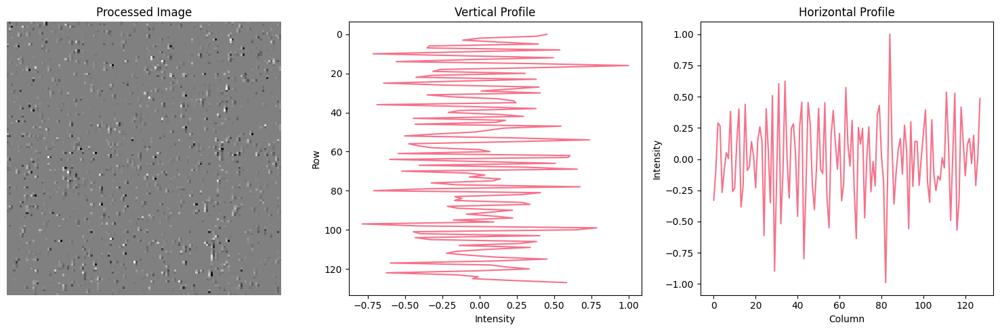


Calculating intensity profiles for narrowbanddrd:


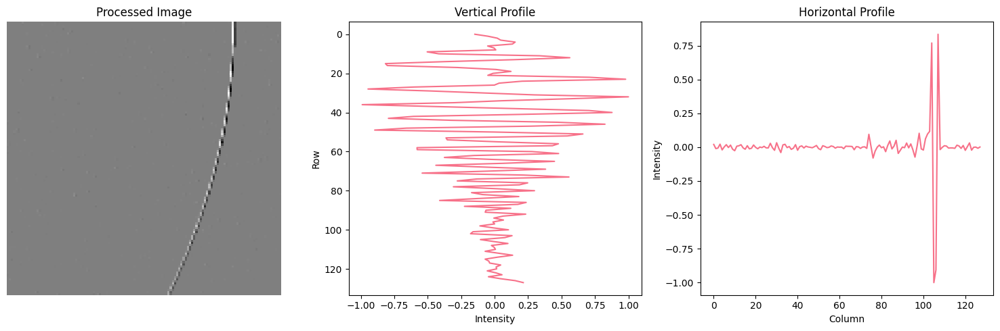


Calculating intensity profiles for noise:


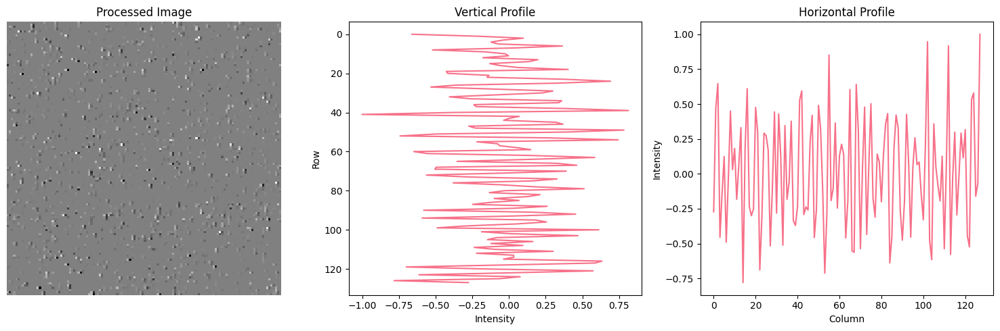


Calculating intensity profiles for brightpixel:


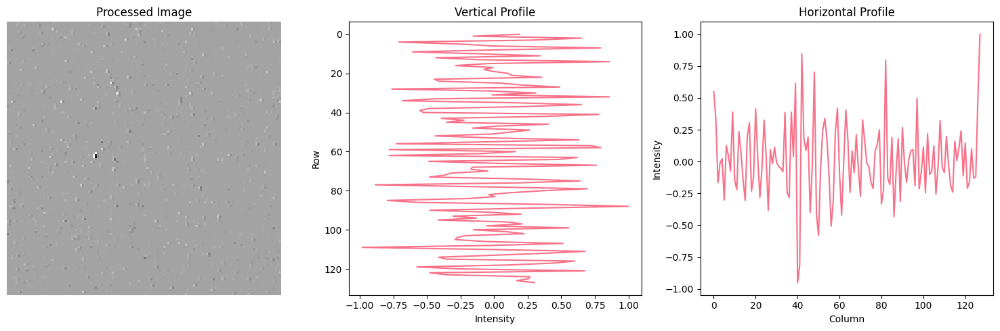

In [10]:
# Below we'll calculate the intensity profiles for each signal type
def plot_intensity_profiles(processed_img, vertical_profile, horizontal_profile):
    # Preprocess image and get profiles
    # processed_img, vertical_profile, horizontal_profile = preprocess_image(img_path)
    
    # Plot image and profiles
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    ax1.imshow(processed_img, cmap='gray')
    ax1.set_title('Processed Image')
    ax1.axis('off')
    
    # Vertical profile
    ax2.plot(vertical_profile, range(len(vertical_profile)))
    ax2.set_title('Vertical Profile')
    ax2.set_xlabel('Intensity')
    ax2.set_ylabel('Row')
    ax2.invert_yaxis()
    
    # Horizontal profile
    ax3.plot(range(len(horizontal_profile)), horizontal_profile)
    ax3.set_title('Horizontal Profile')
    ax3.set_xlabel('Column')
    ax3.set_ylabel('Intensity')
    
    plt.tight_layout()
    plt.show()
    

for signal_type in signal_types:
    print(f"\nCalculating intensity profiles for {signal_type}:")
    img_path = sample_image_paths[signal_type]
    processed_img, vertical_profile, horizontal_profile = preprocess_image(img_path)
    plot_intensity_profiles(processed_img, vertical_profile, horizontal_profile)


#### Batch Processing
Below we'll process all the images in the dataset and save the processed images to the `processed` directory.






In [12]:
# Leaving this commented, as I already did this for all files in the data directory

# preprocess_all_data()

### Feature Extraction
Our analysis uses multiple feature types:
- Flattened pixel values (16,384 features)
- Vertical/horizontal intensity profiles (256 features)
- Statistical features:
  - max, min, mean, std
  - skewness, kurtosis

In [13]:
def load_features():
    """Load processed images and intensity profiles, combine into feature matrix."""
    processed_dir = Path('../data/processed')
    profiles_dir = Path('../data/profiles')
    
    features_list = []
    labels = []
    
    for signal_type in tqdm(processed_dir.iterdir(), desc='Loading features'):
        if not signal_type.is_dir():
            continue
            
        for img_path in signal_type.glob('*.png'):
            # Load processed image
            img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
            img = img.astype(np.float32) / 255.0
            
            # Load intensity profiles
            profile_path = profiles_dir / f"{img_path.stem}_profiles.npz"
            profiles = np.load(str(profile_path))
            
            # Extract features
            features = {
                'flattened': img.flatten(),
                'vertical_profile': profiles['vertical'],
                'horizontal_profile': profiles['horizontal'],
                'max': np.max(img),
                'min': np.min(img),
                'mean': np.mean(img),
                'std': np.std(img),
                'skewness': np.mean((img - np.mean(img))**3) / (np.std(img)**3),
                'kurtosis': np.mean((img - np.mean(img))**4) / (np.std(img)**4)
            }
            
            features_list.append(features)
            labels.append(signal_type.name)
    
    return features_list, labels

def plot_feature_distributions(df, features):
    """Plot distributions of selected features by signal type."""
    n_features = len(features)
    fig, axes = plt.subplots(n_features, 1, figsize=(10, 4*n_features))
    
    for ax, feature in zip(axes, features):
        sns.boxplot(data=df, x='label', y=feature, ax=ax)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
        ax.set_title(f'Distribution of {feature}')
    
    plt.tight_layout()
    plt.show()

In [14]:
# Load features
features_list, labels = load_features()

# Convert to DataFrame
df = pd.DataFrame(features_list)
df['label'] = labels

print(f"Loaded {len(df)} samples with {len(df.columns)-1} features")

Loading features: 0it [00:00, ?it/s]

Loaded 6993 samples with 9 features


/var/folders/dh/7y1zdj_56195j764wf4b6w8m0000gn/T/ipykernel_74206/3441367845.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/dh/7y1zdj_56195j764wf4b6w8m0000gn/T/ipykernel_74206/3441367845.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/dh/7y1zdj_56195j764wf4b6w8m0000gn/T/ipykernel_74206/3441367845.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/var/folders/dh/7y1zdj_56195j764wf4b6w8m0000gn/T/ipykernel_74206/3441367845.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fi

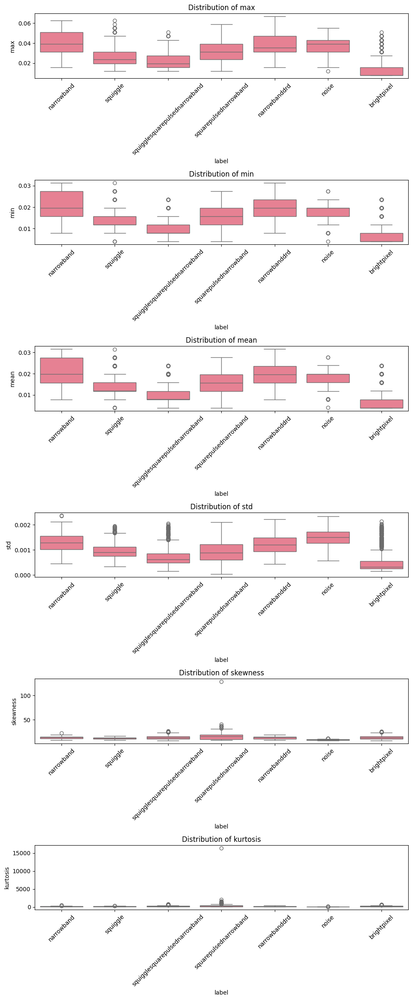

In [15]:
# Plot distributions of statistical features
statistical_features = ['max', 'min', 'mean', 'std', 'skewness', 'kurtosis']
plot_feature_distributions(df, statistical_features)

### Dimensionality Reduction
Below we'll reduce the dimensionality of the data using PCA and UMAP.






/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


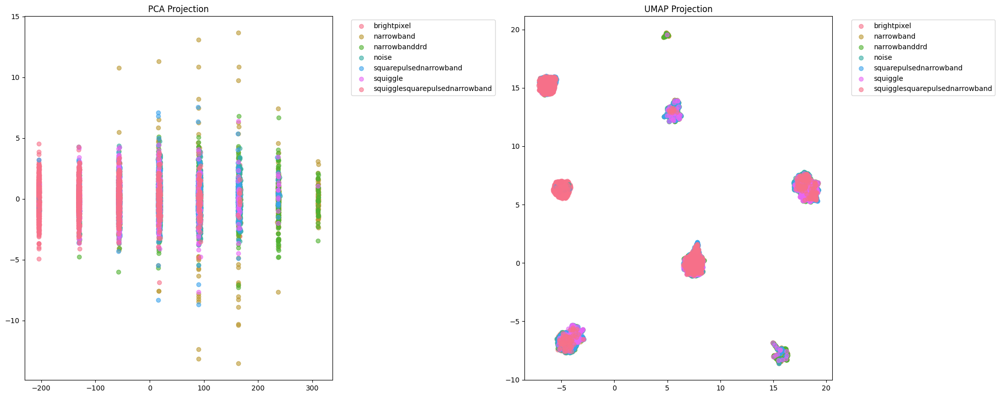

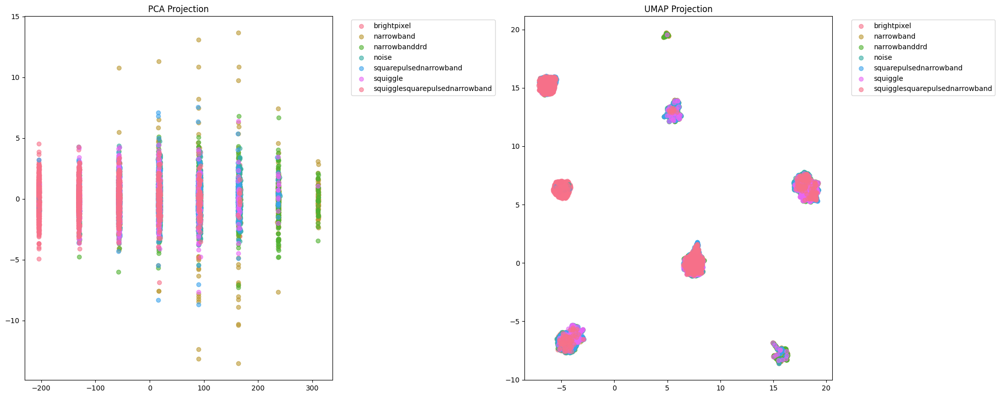

In [17]:
# Reduce dimensions and plot
X_pca, X_umap, clean_labels, X_combined = reduce_dimensions(df)  # Get cleaned labels
plot_reduced_dimensions(X_pca, X_umap, clean_labels)  # Use cleaned labels

- PCA:
  - Most of the classes overlap along PC1
  - PCA isn't finding a clean, 2-D separation between the signal groups
- UMAP:
  - Preserves the structure of the data
  - There is still some overlap between the classes, but it's not as bad as PCA
- Overall Insight:
  - The signal types have distinct features that allow classification
  - The combined feature set (image data, intensity profiles, and statistical features) contain decent discriminitive information

### Clustering Analysis
Below we'll perform a clustering analysis on the data using K-means.






Silhouette score (PCA): 0.953
Silhouette score (UMAP): 0.908


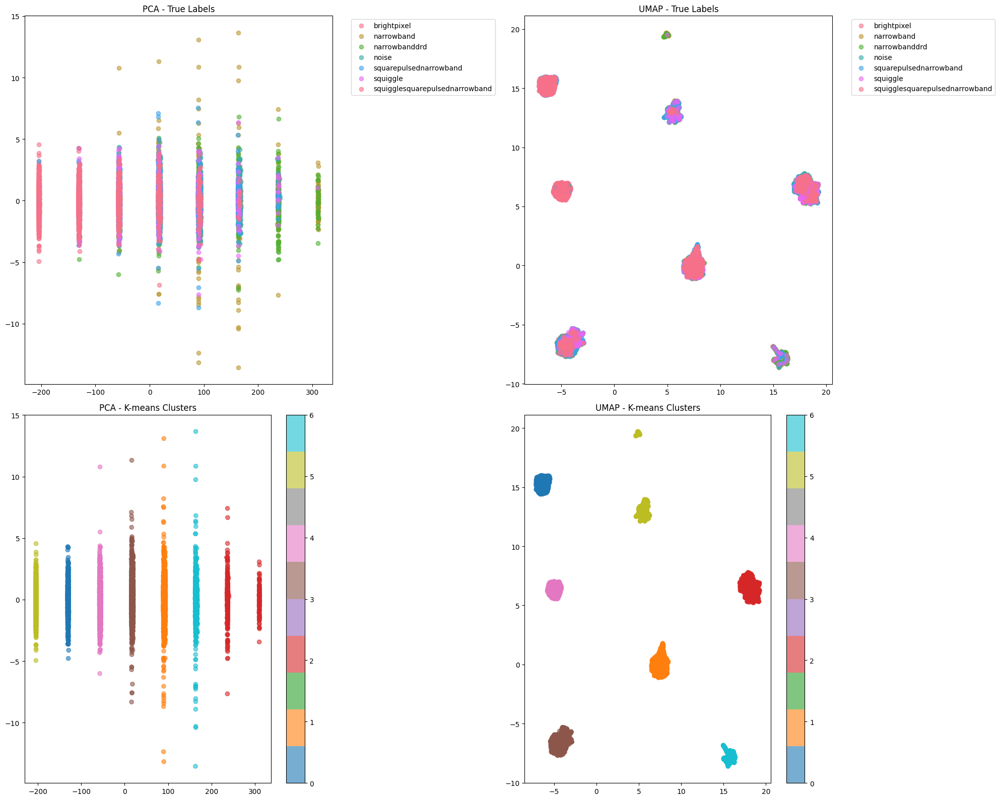

In [20]:
# Run clustering analysis
clusters_pca, clusters_umap = analyze_clusters(X_pca, X_umap, clean_labels)

Clustering performance:
- PCA:
    - The Silhouette score was extremely high, signifying clusters are very cohesive. Even though there seems to be some overlap, K-means managed to cluster the data very well.
- UMAP:
    - UMAP produced visually clear separation of the signal types, and KMeans in UMAP space recovers the true groups


Top 10 Most Important Features:
      Feature  Total_Contribution
0       img_0            0.999886
50  profile_0            0.997244
55  profile_5            0.025700
65   kurtosis            0.023139
53  profile_3            0.020846
64   skewness            0.018666
30     img_30            0.016157
3       img_3            0.015567
37     img_37            0.015294
5       img_5            0.013668

Contribution by Feature Type:
Image Features: 1.314
Profile Features: 1.102
Statistical Features: 0.074


(<Figure size 2000x800 with 2 Axes>,
              PC1       PC2    Feature  Total_Contribution
 0   9.998857e-01  0.000156      img_0            0.999886
 50 -1.111692e-04  0.997244  profile_0            0.997244
 55 -2.150608e-04 -0.025699  profile_5            0.025700
 65 -1.922913e-04  0.023138   kurtosis            0.023139
 53 -3.471034e-05 -0.020846  profile_3            0.020846
 ..           ...       ...        ...                 ...
 44  3.026230e-10  0.001004     img_44            0.001004
 27 -7.556425e-10 -0.000988     img_27            0.000988
 49  1.268924e-09 -0.000312     img_49            0.000312
 39 -1.631569e-09 -0.000200     img_39            0.000200
 19  9.519890e-10  0.000189     img_19            0.000189
 
 [66 rows x 4 columns])

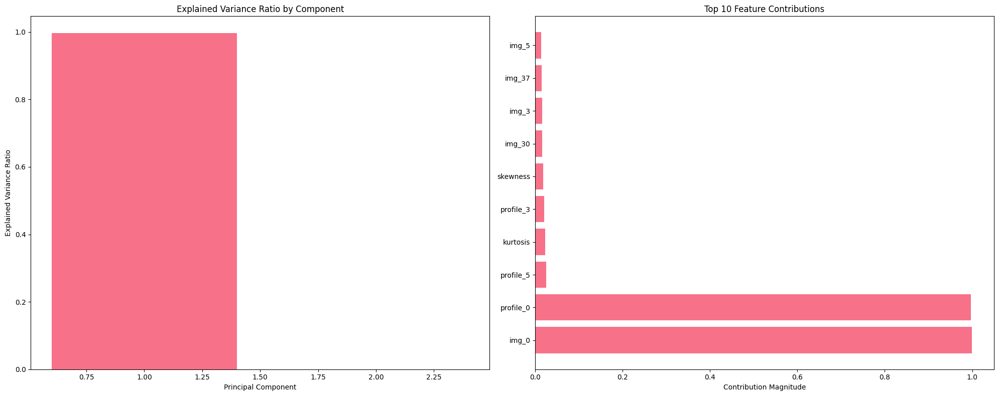

In [21]:
# Get the final PCA object used for 2D projection
final_pca = PCA(n_components=2)
final_pca.fit(X_combined)

# Analyze feature importance
analyze_feature_importance(X_combined, final_pca)

Key Insights:
- The dimensionality reduction of both images and profiles was effective - the first components capture most of the important information
- The vertical banding we saw in the PCA plot might be primarily driven by img_0 and profile_0
- Statistical features, while less important overall, might be helping with fine-grained discrimination

### Anomaly Detection
Below we'll perform an anomaly detection analysis on the data using Isolation Forest. (Noise v. Signal)






/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



Dataset sizes:
Training (noise only): 799 samples
Holdout set: 449 samples
    - Noise test: 200 samples
    - Signals: 249 samples

Total signals available: 5993
Signals used in holdout: 249

ROC AUC Score on balanced holdout set: 0.771


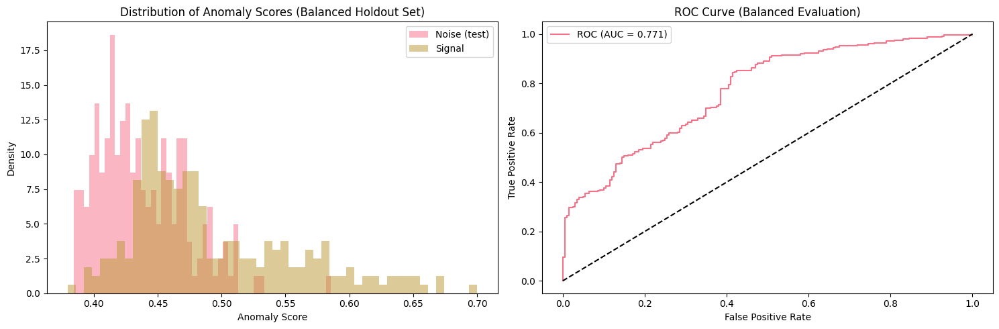

In [23]:
# Run anomaly detection with balanced holdout set
X_train, X_holdout, y_holdout = prepare_anomaly_data(df)
iso_forest, auc, roc_data = detect_anomalies(X_train, X_holdout, y_holdout)

Distribution of Anomolies
- Noise tends to have lower scores while signals have higher scores
- There's overlap, but noise vs. signal is somewhat well-separated

ROC Curve (TPR vs.FPR)
- AUC of .77 indicates moderate ability to distinguish signal from noise. It's better than chance, but with room for improvement


### Matrix Factorization
Below we'll perform a matrix factorization analysis on the data using NMF.






Data shape: (6993, 16384)
Image size: 128x128


/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(



SVD Explained Variance:
Total variance explained by 10 components: 0.974


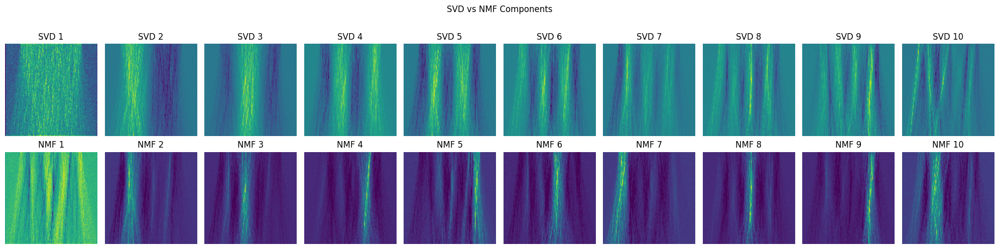

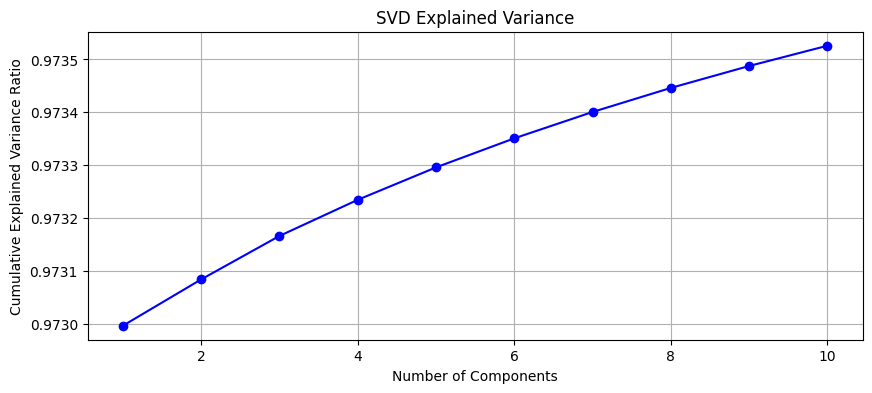

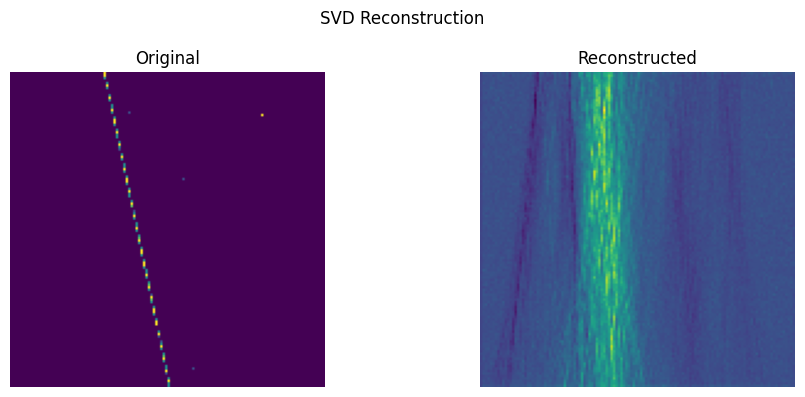

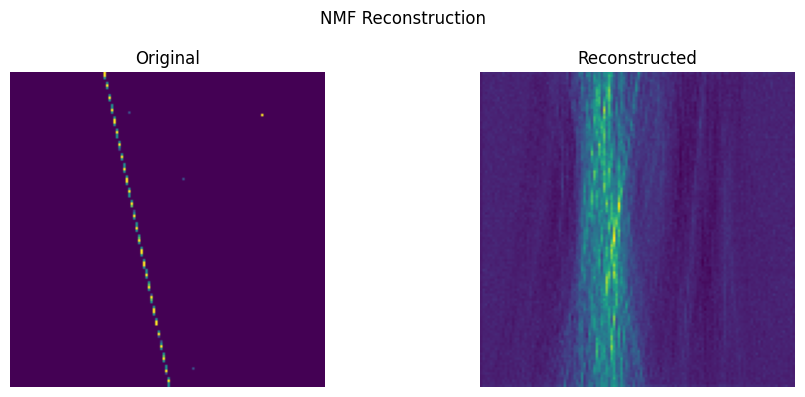

In [25]:
# Run Matrix Factorization
svd, nmf, X_svd, X_nmf, (fig1, fig2, fig3, fig4) = analyze_matrix_factorization(df)

Dimension Reduction:
- With 10 components being able to explain 97% of the variance, we can compress our data with minimal loss.

Denoising:
- Both SVD and NMF smooth away random noise while preserving the signal


### Enhanced Anomaly Detection
Below we'll try and combine the NMF/SVD and Isolation Forest to improve the anomaly detection.

/Users/lmarte/Documents/Projects/CU-Boulder/Final-Proj/.venv/lib/python3.11/site-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(



ROC AUC Score with enhanced features: 0.933


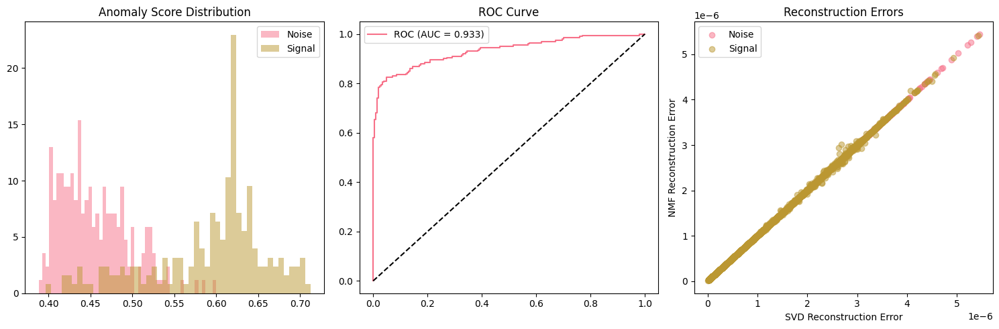

In [29]:
iso, svd, nmf, auc_score, fig = enhanced_anomaly_detection(df)

Below are the improvements

1.ROC AUC Score: 0.933 (up from 0.77)
- Exceeds the project goal of ≥ 0.90
- Substantial improvement from our previous approach
- Shows the value of incorporating matrix factorization features

2.Anomaly Score Distribution (Left Plot):
- Much better separation between noise and signal distributions
- Noise scores concentrated around 0.40-0.52
- Signal scores spread higher, mostly 0.55-0.70
- Clearer decision boundary than before

3.ROC Curve (Middle Plot):
- Sharp initial rise indicates excellent detection at low false positive rates
- High true positive rate achieved quickly
- Curve well above diagonal, showing strong discriminative power
- Better performance across all threshold values

4.Reconstruction Errors (Right Plot):
- Strong linear correlation between SVD and NMF errors
- Slight separation between noise and signal samples
- Suggests both methods capture similar underlying patterns
- Could potentially use just one reconstruction method

5.Key Improvements:
- Adding SVD/NMF components provided more discriminative features
- Reconstruction errors helped identify anomalous patterns
- Combined approach captured both linear and non-linear patterns
- Balanced dataset gave more reliable evaluation